<a href="https://colab.research.google.com/github/9-coding/ComputerVision_TeamProject/blob/main/ActiveLearning2/ActiveLearning2_modelCompare_effi_b4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

import os
# 각자 환경에서 이 부분만 변경하여 사용하면 됩니다.
os.chdir('/content/gdrive/MyDrive/CUB_200_2011_repackage_class50')
print(os.getcwd())



Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).
/content/gdrive/MyDrive/CUB_200_2011_repackage_class50


In [ ]:
# !pip uninstall wandb

In [ ]:
!pip install wandb

In [ ]:
!wandb login f9fc6c65de4904021a59f4c8c60b90961f6ec1fb

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import time
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from PIL import Image
import random

## wandb ###
import wandb
wandb.init(project='ActiveLearning2_modelCompare')

'''def set_seed(seed: int = 42) -> None:
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")

set_seed(42)'''


### GPU Setting ###
USE_CUDA = torch.cuda.is_available()
DEVICE = torch.device("cuda" if USE_CUDA else "cpu")
print(DEVICE)

### Custom Dataset ###
class CUB2011(Dataset):
    def __init__(self, transform, mode='train'):
        self.transform = transform
        self.mode = mode
        self.image_folder = os.listdir(f'./datasets/{mode}')

    def __len__(self):
        return len(self.image_folder)

    def __getitem__(self, idx):
        img_path = self.image_folder[idx]
        img = Image.open(os.path.join('./datasets', self.mode, img_path)).convert('RGB')
        img = self.transform(img)
        label = int(img_path.split('_')[-1].split('.')[0])
        return (img, label)

cuda


In [ ]:
### Data Augmentation ###
def transforms_func(transform):
  return transforms.Compose([
    transforms.Resize((448, 448)),
    transform,
    transforms.ToTensor(),
])

def transforms_resize_func(resize):
  return transforms.Compose([
    resize,
    transforms.ToTensor(),
])

ROTATION_DEGREE = 30
zoom_scale = (0.8, 1.2)
transforms_rotation = transforms_func(transforms.RandomRotation(degrees=ROTATION_DEGREE))
transforms_horizontal_flip = transforms_func(transforms.RandomHorizontalFlip(p=1.0))
transforms_zoom = transforms_func(transforms.RandomResizedCrop(448, scale=zoom_scale))

transforms_train = transforms_resize_func(transforms.Resize((448, 448)))
transforms_valtest = transforms_resize_func(transforms.Resize((448, 448)))
transforms_random_resized_crop = transforms_resize_func(transforms.RandomResizedCrop(448, scale=(0.8, 1.0)))

In [ ]:
BATCH_SIZE = 8
EPOCH = 20
lr = 0.1

train_set = CUB2011(mode='train', transform=transforms_train)
train_set_rotation = CUB2011(mode='train', transform=transforms_rotation)
train_set_horizontal_flip = CUB2011(mode='train', transform=transforms_horizontal_flip)
train_set_randomcrop =  CUB2011(mode='train', transform=transforms_random_resized_crop)
train_set_zoom = CUB2011(mode='train', transform=transforms_zoom)

combined_train_set = ConcatDataset([train_set, train_set_rotation, train_set_horizontal_flip, train_set_zoom])

val_set = CUB2011(mode='valid', transform=transforms_valtest)
test_set = CUB2011(mode='test', transform=transforms_valtest)

train_loader = DataLoader(combined_train_set, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
!pip install efficientnet_pytorch

In [ ]:
import torchsummary
from efficientnet_pytorch import EfficientNet
model = EfficientNet.from_pretrained('efficientnet-b4', num_classes=50)
model = model.to(DEVICE)
optimizer = optim.SGD(model.parameters(), lr=lr)

print("EfficientNet-b4")
print(model)

Loaded pretrained weights for efficientnet-b4
EfficientNet-b4
EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    3, 48, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d((0, 1, 0, 1))
  )
  (_bn0): BatchNorm2d(48, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        48, 48, kernel_size=(3, 3), stride=[1, 1], groups=48, bias=False
        (static_padding): ZeroPad2d((1, 1, 1, 1))
      )
      (_bn1): BatchNorm2d(48, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        48, 12, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_se_expand): Conv2dStaticSamePadding(
        12, 48, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_project_conv): Conv2dStaticSamePadding(
  

In [ ]:
### Train/Evaluation ###
def train(model, train_loader, optimizer, epoch):
    model.train()
    for i, (image, target) in enumerate(train_loader):
        image, target = image.to(DEVICE), target.to(DEVICE)
        output = model(image)
        optimizer.zero_grad()
        train_loss = F.cross_entropy(output, target).to(DEVICE)
        train_loss.backward()
        optimizer.step()

        if i % 30 == 0:
            print(f'Train Epoch {epoch} [{i}/{len(train_loader)}]\tLoss: {train_loss.item():.6f}')
    return train_loss

def evaluate(model, val_loader):
    model.eval()
    eval_loss = 0
    correct = 0
    with torch.no_grad():
        for i, (image, target) in enumerate(val_loader):
            image, target = image.to(DEVICE), target.to(DEVICE)
            output = model(image)
            eval_loss += F.cross_entropy(output, target, reduction='sum').item()
            pred = output.max(1, keepdim=True)[1]
            correct += pred.eq(target.view_as(pred)).sum().item()
        eval_loss /= len(val_loader.dataset)
        eval_accuracy = 100 * correct / len(val_loader.dataset)
        return eval_loss, eval_accuracy

Train Epoch 0 [0/1180]	Loss: 3.907397
Train Epoch 0 [30/1180]	Loss: 3.475759
Train Epoch 0 [60/1180]	Loss: 2.429700
Train Epoch 0 [90/1180]	Loss: 1.303935
Train Epoch 0 [120/1180]	Loss: 1.341550
Train Epoch 0 [150/1180]	Loss: 1.140358
Train Epoch 0 [180/1180]	Loss: 0.667344
Train Epoch 0 [210/1180]	Loss: 0.768385
Train Epoch 0 [240/1180]	Loss: 0.493431
Train Epoch 0 [270/1180]	Loss: 0.804463
Train Epoch 0 [300/1180]	Loss: 0.230894
Train Epoch 0 [330/1180]	Loss: 0.301307
Train Epoch 0 [360/1180]	Loss: 0.806884
Train Epoch 0 [390/1180]	Loss: 0.529793
Train Epoch 0 [420/1180]	Loss: 0.617086
Train Epoch 0 [450/1180]	Loss: 0.131877
Train Epoch 0 [480/1180]	Loss: 0.121763
Train Epoch 0 [510/1180]	Loss: 0.205385
Train Epoch 0 [540/1180]	Loss: 0.610470
Train Epoch 0 [570/1180]	Loss: 0.165893
Train Epoch 0 [600/1180]	Loss: 0.402217
Train Epoch 0 [630/1180]	Loss: 0.463589
Train Epoch 0 [660/1180]	Loss: 0.395772
Train Epoch 0 [690/1180]	Loss: 0.121059
Train Epoch 0 [720/1180]	Loss: 0.112381
Train

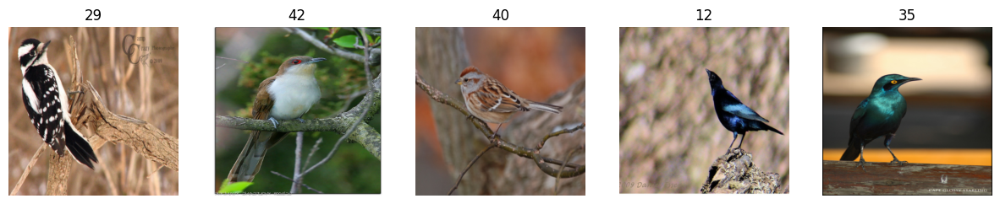

Epoch 0
Train Loss: 0.0516, Validation Loss: 0.2396, Validation Accuracy: 92.23%

Train Epoch 1 [0/1180]	Loss: 0.143076
Train Epoch 1 [30/1180]	Loss: 0.035908
Train Epoch 1 [60/1180]	Loss: 0.021415
Train Epoch 1 [90/1180]	Loss: 0.204572
Train Epoch 1 [120/1180]	Loss: 0.031484
Train Epoch 1 [150/1180]	Loss: 0.079636
Train Epoch 1 [180/1180]	Loss: 0.001626
Train Epoch 1 [210/1180]	Loss: 0.008591
Train Epoch 1 [240/1180]	Loss: 0.075686
Train Epoch 1 [270/1180]	Loss: 0.013855
Train Epoch 1 [300/1180]	Loss: 0.028213
Train Epoch 1 [330/1180]	Loss: 0.156440
Train Epoch 1 [360/1180]	Loss: 0.024867
Train Epoch 1 [390/1180]	Loss: 0.009916
Train Epoch 1 [420/1180]	Loss: 0.054835
Train Epoch 1 [450/1180]	Loss: 0.005604
Train Epoch 1 [480/1180]	Loss: 0.011340
Train Epoch 1 [510/1180]	Loss: 0.058257
Train Epoch 1 [540/1180]	Loss: 0.013248
Train Epoch 1 [570/1180]	Loss: 0.011705
Train Epoch 1 [600/1180]	Loss: 0.069535
Train Epoch 1 [630/1180]	Loss: 0.045727
Train Epoch 1 [660/1180]	Loss: 0.006510
Tra

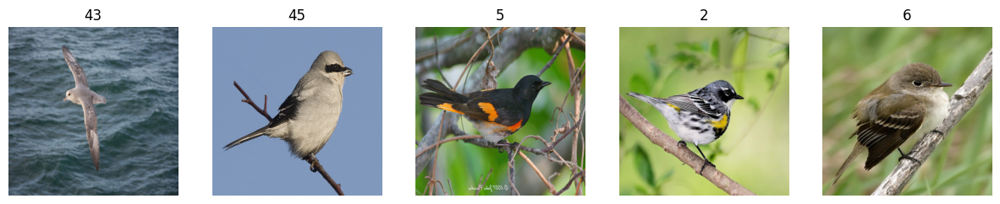

Epoch 1
Train Loss: 0.0124, Validation Loss: 0.2608, Validation Accuracy: 92.91%

Train Epoch 2 [0/1180]	Loss: 0.010286
Train Epoch 2 [30/1180]	Loss: 0.000886
Train Epoch 2 [60/1180]	Loss: 0.009266
Train Epoch 2 [90/1180]	Loss: 0.019480
Train Epoch 2 [120/1180]	Loss: 0.038452
Train Epoch 2 [150/1180]	Loss: 0.096789
Train Epoch 2 [180/1180]	Loss: 0.061342
Train Epoch 2 [210/1180]	Loss: 0.168485
Train Epoch 2 [240/1180]	Loss: 0.002203
Train Epoch 2 [270/1180]	Loss: 0.004275
Train Epoch 2 [300/1180]	Loss: 0.011450
Train Epoch 2 [330/1180]	Loss: 0.022833
Train Epoch 2 [360/1180]	Loss: 0.024746
Train Epoch 2 [390/1180]	Loss: 0.012306
Train Epoch 2 [420/1180]	Loss: 0.017652
Train Epoch 2 [450/1180]	Loss: 0.017814
Train Epoch 2 [480/1180]	Loss: 0.024253
Train Epoch 2 [510/1180]	Loss: 0.021913
Train Epoch 2 [540/1180]	Loss: 0.024222
Train Epoch 2 [570/1180]	Loss: 0.023416
Train Epoch 2 [600/1180]	Loss: 0.005257
Train Epoch 2 [630/1180]	Loss: 0.003671
Train Epoch 2 [660/1180]	Loss: 0.178010
Tra

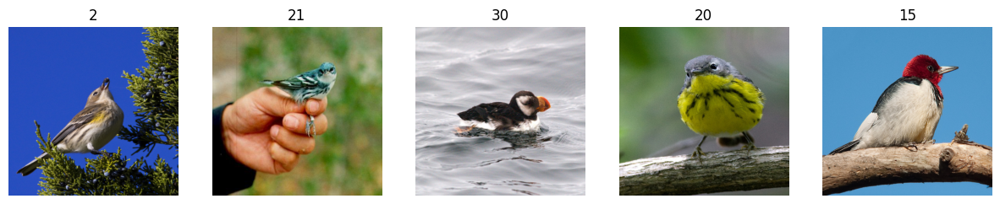

Epoch 2
Train Loss: 0.0307, Validation Loss: 0.2168, Validation Accuracy: 95.61%

Train Epoch 3 [0/1180]	Loss: 0.010542
Train Epoch 3 [30/1180]	Loss: 0.018960
Train Epoch 3 [60/1180]	Loss: 0.004429
Train Epoch 3 [90/1180]	Loss: 0.001187
Train Epoch 3 [120/1180]	Loss: 0.029013
Train Epoch 3 [150/1180]	Loss: 0.002360
Train Epoch 3 [180/1180]	Loss: 0.001886
Train Epoch 3 [210/1180]	Loss: 0.001592
Train Epoch 3 [240/1180]	Loss: 0.075754
Train Epoch 3 [270/1180]	Loss: 0.067308
Train Epoch 3 [300/1180]	Loss: 0.007471
Train Epoch 3 [330/1180]	Loss: 0.039809
Train Epoch 3 [360/1180]	Loss: 0.001002
Train Epoch 3 [390/1180]	Loss: 0.009039
Train Epoch 3 [420/1180]	Loss: 0.010579
Train Epoch 3 [450/1180]	Loss: 0.013341
Train Epoch 3 [480/1180]	Loss: 0.001791
Train Epoch 3 [510/1180]	Loss: 0.000995
Train Epoch 3 [540/1180]	Loss: 0.003721
Train Epoch 3 [570/1180]	Loss: 0.002868
Train Epoch 3 [600/1180]	Loss: 0.001463
Train Epoch 3 [630/1180]	Loss: 0.007324
Train Epoch 3 [660/1180]	Loss: 0.060197
Tra

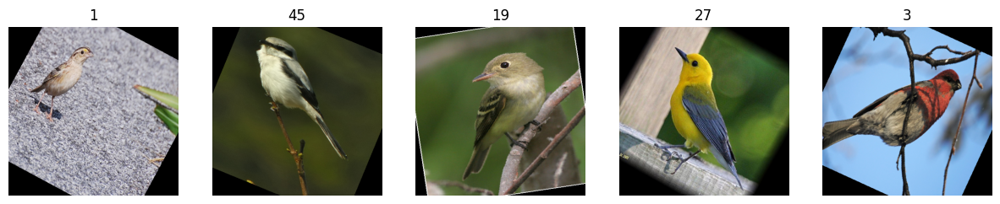

Epoch 3
Train Loss: 0.0035, Validation Loss: 0.2692, Validation Accuracy: 92.57%

Train Epoch 4 [0/1180]	Loss: 0.003407
Train Epoch 4 [30/1180]	Loss: 0.077973
Train Epoch 4 [60/1180]	Loss: 0.007776
Train Epoch 4 [90/1180]	Loss: 0.003677
Train Epoch 4 [120/1180]	Loss: 0.003093
Train Epoch 4 [150/1180]	Loss: 0.009816
Train Epoch 4 [180/1180]	Loss: 0.006308
Train Epoch 4 [210/1180]	Loss: 0.092326
Train Epoch 4 [240/1180]	Loss: 0.003659
Train Epoch 4 [270/1180]	Loss: 0.001757
Train Epoch 4 [300/1180]	Loss: 0.009636
Train Epoch 4 [330/1180]	Loss: 0.026259
Train Epoch 4 [360/1180]	Loss: 0.001533
Train Epoch 4 [390/1180]	Loss: 0.006610
Train Epoch 4 [420/1180]	Loss: 0.012943
Train Epoch 4 [450/1180]	Loss: 0.006376
Train Epoch 4 [480/1180]	Loss: 0.001056
Train Epoch 4 [510/1180]	Loss: 0.000218
Train Epoch 4 [540/1180]	Loss: 0.000948
Train Epoch 4 [570/1180]	Loss: 0.000399
Train Epoch 4 [600/1180]	Loss: 0.001633
Train Epoch 4 [630/1180]	Loss: 0.000390
Train Epoch 4 [660/1180]	Loss: 0.006191
Tra

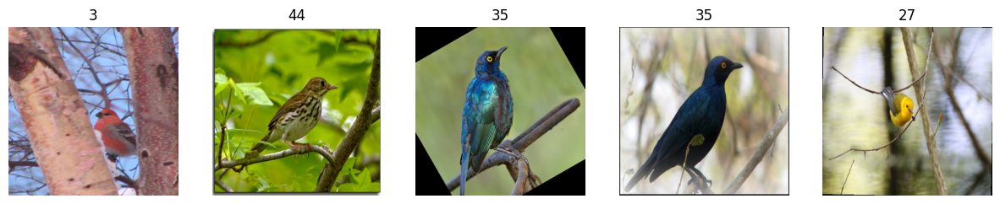

Epoch 4
Train Loss: 0.0039, Validation Loss: 0.2368, Validation Accuracy: 93.24%

Train Epoch 5 [0/1180]	Loss: 0.001648
Train Epoch 5 [30/1180]	Loss: 0.002855
Train Epoch 5 [60/1180]	Loss: 0.001855
Train Epoch 5 [90/1180]	Loss: 0.011651
Train Epoch 5 [120/1180]	Loss: 0.002802
Train Epoch 5 [150/1180]	Loss: 0.002758
Train Epoch 5 [180/1180]	Loss: 0.197383
Train Epoch 5 [210/1180]	Loss: 0.362322
Train Epoch 5 [240/1180]	Loss: 0.002352
Train Epoch 5 [270/1180]	Loss: 0.001348
Train Epoch 5 [300/1180]	Loss: 0.002057
Train Epoch 5 [330/1180]	Loss: 0.000943
Train Epoch 5 [360/1180]	Loss: 0.001132
Train Epoch 5 [390/1180]	Loss: 0.007071
Train Epoch 5 [420/1180]	Loss: 0.000411
Train Epoch 5 [450/1180]	Loss: 0.076821
Train Epoch 5 [480/1180]	Loss: 0.001848
Train Epoch 5 [510/1180]	Loss: 0.001236
Train Epoch 5 [540/1180]	Loss: 0.008749
Train Epoch 5 [570/1180]	Loss: 0.020130
Train Epoch 5 [600/1180]	Loss: 0.025754
Train Epoch 5 [630/1180]	Loss: 0.001102
Train Epoch 5 [660/1180]	Loss: 0.002747
Tra

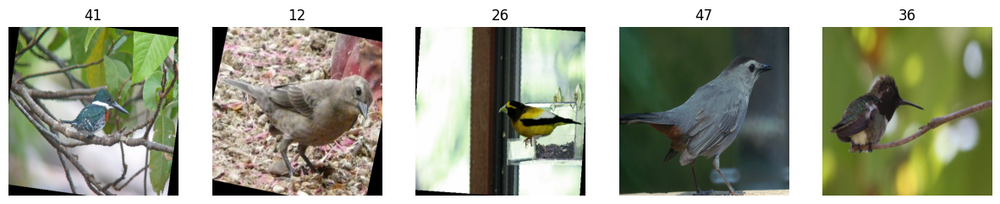

Epoch 5
Train Loss: 0.0094, Validation Loss: 0.1854, Validation Accuracy: 94.59%

Train Epoch 6 [0/1180]	Loss: 0.004820
Train Epoch 6 [30/1180]	Loss: 0.000714
Train Epoch 6 [60/1180]	Loss: 0.003935
Train Epoch 6 [90/1180]	Loss: 0.000572
Train Epoch 6 [120/1180]	Loss: 0.001602
Train Epoch 6 [150/1180]	Loss: 0.000108
Train Epoch 6 [180/1180]	Loss: 0.000546
Train Epoch 6 [210/1180]	Loss: 0.000976
Train Epoch 6 [240/1180]	Loss: 0.000185
Train Epoch 6 [270/1180]	Loss: 0.009255
Train Epoch 6 [300/1180]	Loss: 0.004774
Train Epoch 6 [330/1180]	Loss: 0.000591
Train Epoch 6 [360/1180]	Loss: 0.000611
Train Epoch 6 [390/1180]	Loss: 0.006926
Train Epoch 6 [420/1180]	Loss: 0.001937
Train Epoch 6 [450/1180]	Loss: 0.004943
Train Epoch 6 [480/1180]	Loss: 0.006748
Train Epoch 6 [510/1180]	Loss: 0.000138
Train Epoch 6 [540/1180]	Loss: 0.001162
Train Epoch 6 [570/1180]	Loss: 0.043622
Train Epoch 6 [600/1180]	Loss: 0.002873
Train Epoch 6 [630/1180]	Loss: 0.002577
Train Epoch 6 [660/1180]	Loss: 0.003846
Tra

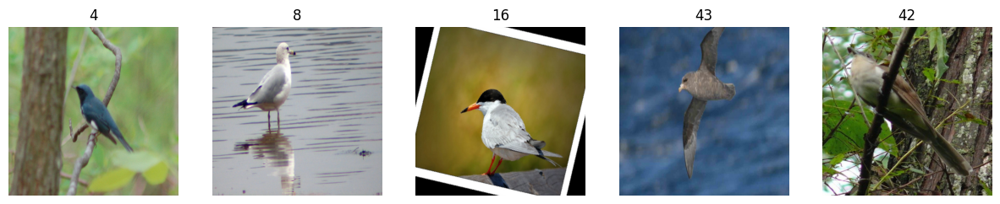

Epoch 6
Train Loss: 0.0003, Validation Loss: 0.2532, Validation Accuracy: 93.24%

Train Epoch 7 [0/1180]	Loss: 0.004333
Train Epoch 7 [30/1180]	Loss: 0.006968
Train Epoch 7 [60/1180]	Loss: 0.002912
Train Epoch 7 [90/1180]	Loss: 0.000484
Train Epoch 7 [120/1180]	Loss: 0.040168
Train Epoch 7 [150/1180]	Loss: 0.005474
Train Epoch 7 [180/1180]	Loss: 0.001051
Train Epoch 7 [210/1180]	Loss: 0.046574
Train Epoch 7 [240/1180]	Loss: 0.005353
Train Epoch 7 [270/1180]	Loss: 0.001784
Train Epoch 7 [300/1180]	Loss: 0.004108
Train Epoch 7 [330/1180]	Loss: 0.003792
Train Epoch 7 [360/1180]	Loss: 0.007591
Train Epoch 7 [390/1180]	Loss: 0.000201
Train Epoch 7 [420/1180]	Loss: 0.000501
Train Epoch 7 [450/1180]	Loss: 0.001056
Train Epoch 7 [480/1180]	Loss: 0.000250
Train Epoch 7 [510/1180]	Loss: 0.003581
Train Epoch 7 [540/1180]	Loss: 0.008586
Train Epoch 7 [570/1180]	Loss: 0.001714
Train Epoch 7 [600/1180]	Loss: 0.007556
Train Epoch 7 [630/1180]	Loss: 0.004638
Train Epoch 7 [660/1180]	Loss: 0.002048
Tra

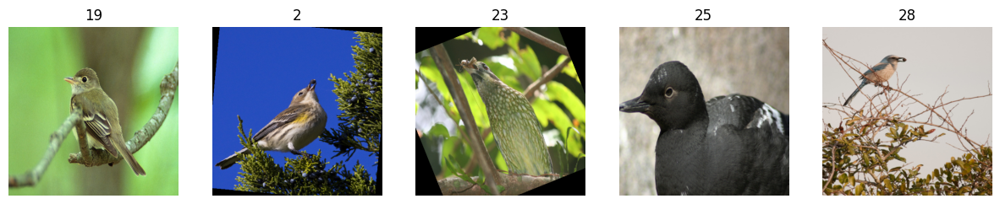

Epoch 7
Train Loss: 0.0003, Validation Loss: 0.2786, Validation Accuracy: 91.89%

Train Epoch 8 [0/1180]	Loss: 0.000068
Train Epoch 8 [30/1180]	Loss: 0.000447
Train Epoch 8 [60/1180]	Loss: 0.000825
Train Epoch 8 [90/1180]	Loss: 0.029832
Train Epoch 8 [120/1180]	Loss: 0.000410
Train Epoch 8 [150/1180]	Loss: 0.002563
Train Epoch 8 [180/1180]	Loss: 0.001249
Train Epoch 8 [210/1180]	Loss: 0.001008
Train Epoch 8 [240/1180]	Loss: 0.002354
Train Epoch 8 [270/1180]	Loss: 0.000139
Train Epoch 8 [300/1180]	Loss: 0.008444
Train Epoch 8 [330/1180]	Loss: 0.013207
Train Epoch 8 [360/1180]	Loss: 0.000965
Train Epoch 8 [390/1180]	Loss: 0.000527
Train Epoch 8 [420/1180]	Loss: 0.000880
Train Epoch 8 [450/1180]	Loss: 0.000861
Train Epoch 8 [480/1180]	Loss: 0.000145
Train Epoch 8 [510/1180]	Loss: 0.002630
Train Epoch 8 [540/1180]	Loss: 0.000237
Train Epoch 8 [570/1180]	Loss: 0.000259
Train Epoch 8 [600/1180]	Loss: 0.000189
Train Epoch 8 [630/1180]	Loss: 0.000487
Train Epoch 8 [660/1180]	Loss: 0.000634
Tra

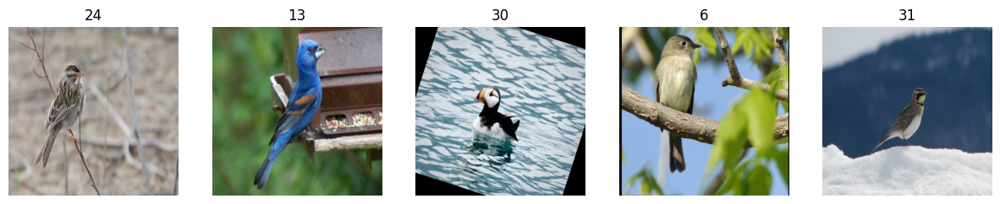

Epoch 8
Train Loss: 0.0016, Validation Loss: 0.3322, Validation Accuracy: 92.23%

Train Epoch 9 [0/1180]	Loss: 0.000495
Train Epoch 9 [30/1180]	Loss: 0.003392
Train Epoch 9 [60/1180]	Loss: 0.000351
Train Epoch 9 [90/1180]	Loss: 0.000937
Train Epoch 9 [120/1180]	Loss: 0.000564
Train Epoch 9 [150/1180]	Loss: 0.000164
Train Epoch 9 [180/1180]	Loss: 0.001753
Train Epoch 9 [210/1180]	Loss: 0.000582
Train Epoch 9 [240/1180]	Loss: 0.000301
Train Epoch 9 [270/1180]	Loss: 0.001518
Train Epoch 9 [300/1180]	Loss: 0.005558
Train Epoch 9 [330/1180]	Loss: 0.000640
Train Epoch 9 [360/1180]	Loss: 0.003563
Train Epoch 9 [390/1180]	Loss: 0.000344
Train Epoch 9 [420/1180]	Loss: 0.000762
Train Epoch 9 [450/1180]	Loss: 0.001170
Train Epoch 9 [480/1180]	Loss: 0.000339
Train Epoch 9 [510/1180]	Loss: 0.003098
Train Epoch 9 [540/1180]	Loss: 0.000237
Train Epoch 9 [570/1180]	Loss: 0.000719
Train Epoch 9 [600/1180]	Loss: 0.095981
Train Epoch 9 [630/1180]	Loss: 0.000158
Train Epoch 9 [660/1180]	Loss: 0.000670
Tra

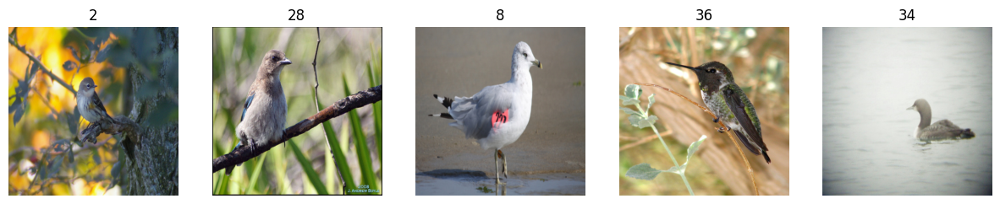

Epoch 9
Train Loss: 0.0003, Validation Loss: 0.3357, Validation Accuracy: 93.58%

Train Epoch 10 [0/1180]	Loss: 0.033891
Train Epoch 10 [30/1180]	Loss: 0.000889
Train Epoch 10 [60/1180]	Loss: 0.000283
Train Epoch 10 [90/1180]	Loss: 0.002449
Train Epoch 10 [120/1180]	Loss: 0.000737
Train Epoch 10 [150/1180]	Loss: 0.000277
Train Epoch 10 [180/1180]	Loss: 0.000550
Train Epoch 10 [210/1180]	Loss: 0.000531
Train Epoch 10 [240/1180]	Loss: 0.000935
Train Epoch 10 [270/1180]	Loss: 0.000189
Train Epoch 10 [300/1180]	Loss: 0.001068
Train Epoch 10 [330/1180]	Loss: 0.001687
Train Epoch 10 [360/1180]	Loss: 0.001490
Train Epoch 10 [390/1180]	Loss: 0.002319
Train Epoch 10 [420/1180]	Loss: 0.000063
Train Epoch 10 [450/1180]	Loss: 0.002043
Train Epoch 10 [480/1180]	Loss: 0.000119
Train Epoch 10 [510/1180]	Loss: 0.007921
Train Epoch 10 [540/1180]	Loss: 0.000458
Train Epoch 10 [570/1180]	Loss: 0.000766
Train Epoch 10 [600/1180]	Loss: 0.035955
Train Epoch 10 [630/1180]	Loss: 0.029047
Train Epoch 10 [660/1

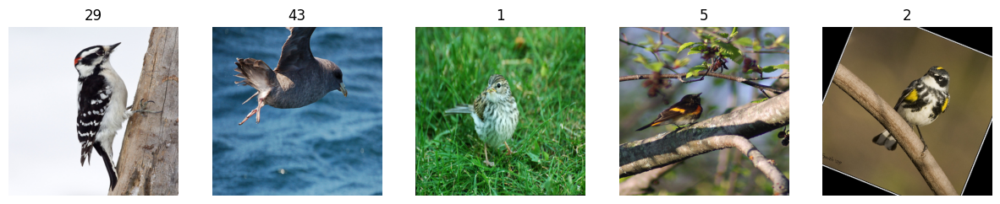

Epoch 10
Train Loss: 0.0002, Validation Loss: 0.2460, Validation Accuracy: 94.59%

Train Epoch 11 [0/1180]	Loss: 0.000200
Train Epoch 11 [30/1180]	Loss: 0.004536
Train Epoch 11 [60/1180]	Loss: 0.000550
Train Epoch 11 [90/1180]	Loss: 0.000070
Train Epoch 11 [120/1180]	Loss: 0.000432
Train Epoch 11 [150/1180]	Loss: 0.000847
Train Epoch 11 [180/1180]	Loss: 0.017013
Train Epoch 11 [210/1180]	Loss: 0.006842
Train Epoch 11 [240/1180]	Loss: 0.004293
Train Epoch 11 [270/1180]	Loss: 0.002677
Train Epoch 11 [300/1180]	Loss: 0.001979
Train Epoch 11 [330/1180]	Loss: 0.003085
Train Epoch 11 [360/1180]	Loss: 0.004639
Train Epoch 11 [390/1180]	Loss: 0.012760
Train Epoch 11 [420/1180]	Loss: 0.018200
Train Epoch 11 [450/1180]	Loss: 0.000139
Train Epoch 11 [480/1180]	Loss: 0.005602
Train Epoch 11 [510/1180]	Loss: 0.000529
Train Epoch 11 [540/1180]	Loss: 0.003690
Train Epoch 11 [570/1180]	Loss: 0.000333
Train Epoch 11 [600/1180]	Loss: 0.000069
Train Epoch 11 [630/1180]	Loss: 0.000117
Train Epoch 11 [660/

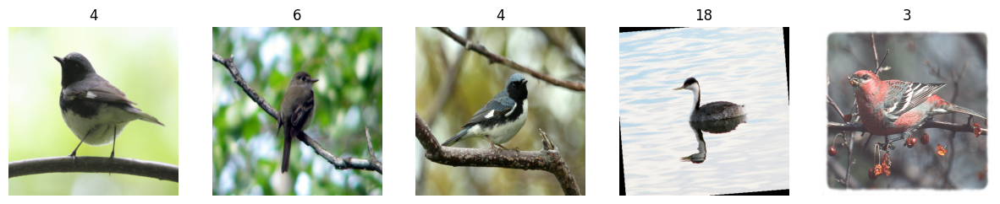

Epoch 11
Train Loss: 0.0012, Validation Loss: 0.2620, Validation Accuracy: 93.58%

Train Epoch 12 [0/1180]	Loss: 0.000099
Train Epoch 12 [30/1180]	Loss: 0.006672
Train Epoch 12 [60/1180]	Loss: 0.000461
Train Epoch 12 [90/1180]	Loss: 0.001171
Train Epoch 12 [120/1180]	Loss: 0.000815
Train Epoch 12 [150/1180]	Loss: 0.000251
Train Epoch 12 [180/1180]	Loss: 0.000268
Train Epoch 12 [210/1180]	Loss: 0.000915
Train Epoch 12 [240/1180]	Loss: 0.000548
Train Epoch 12 [270/1180]	Loss: 0.000276
Train Epoch 12 [300/1180]	Loss: 0.007822
Train Epoch 12 [330/1180]	Loss: 0.000564
Train Epoch 12 [360/1180]	Loss: 0.000231
Train Epoch 12 [390/1180]	Loss: 0.011744
Train Epoch 12 [420/1180]	Loss: 0.000744
Train Epoch 12 [450/1180]	Loss: 0.000174
Train Epoch 12 [480/1180]	Loss: 0.002624
Train Epoch 12 [510/1180]	Loss: 0.000080
Train Epoch 12 [540/1180]	Loss: 0.005974
Train Epoch 12 [570/1180]	Loss: 0.000447
Train Epoch 12 [600/1180]	Loss: 0.000205
Train Epoch 12 [630/1180]	Loss: 0.000584
Train Epoch 12 [660/

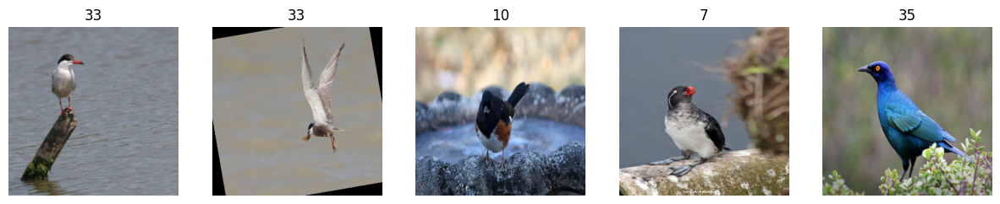

Epoch 12
Train Loss: 0.0018, Validation Loss: 0.2656, Validation Accuracy: 95.61%

Train Epoch 13 [0/1180]	Loss: 0.003678
Train Epoch 13 [30/1180]	Loss: 0.000164
Train Epoch 13 [60/1180]	Loss: 0.000163
Train Epoch 13 [90/1180]	Loss: 0.001532
Train Epoch 13 [120/1180]	Loss: 0.000271
Train Epoch 13 [150/1180]	Loss: 0.001939
Train Epoch 13 [180/1180]	Loss: 0.000406
Train Epoch 13 [210/1180]	Loss: 0.000211
Train Epoch 13 [240/1180]	Loss: 0.000139
Train Epoch 13 [270/1180]	Loss: 0.000085
Train Epoch 13 [300/1180]	Loss: 0.003645
Train Epoch 13 [330/1180]	Loss: 0.000416
Train Epoch 13 [360/1180]	Loss: 0.001343
Train Epoch 13 [390/1180]	Loss: 0.001824
Train Epoch 13 [420/1180]	Loss: 0.000033
Train Epoch 13 [450/1180]	Loss: 0.000523
Train Epoch 13 [480/1180]	Loss: 0.000086
Train Epoch 13 [510/1180]	Loss: 0.001337
Train Epoch 13 [540/1180]	Loss: 0.002404
Train Epoch 13 [570/1180]	Loss: 0.001204
Train Epoch 13 [600/1180]	Loss: 0.000012
Train Epoch 13 [630/1180]	Loss: 0.000340
Train Epoch 13 [660/

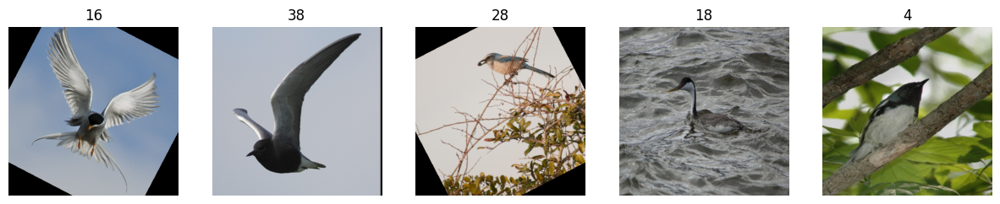

Epoch 13
Train Loss: 0.0001, Validation Loss: 0.2590, Validation Accuracy: 93.92%

Train Epoch 14 [0/1180]	Loss: 0.000082
Train Epoch 14 [30/1180]	Loss: 0.001473
Train Epoch 14 [60/1180]	Loss: 0.000233
Train Epoch 14 [90/1180]	Loss: 0.000069
Train Epoch 14 [120/1180]	Loss: 0.000117
Train Epoch 14 [150/1180]	Loss: 0.000366
Train Epoch 14 [180/1180]	Loss: 0.000754
Train Epoch 14 [210/1180]	Loss: 0.000620
Train Epoch 14 [240/1180]	Loss: 0.000326
Train Epoch 14 [270/1180]	Loss: 0.000226
Train Epoch 14 [300/1180]	Loss: 0.000573
Train Epoch 14 [330/1180]	Loss: 0.000198
Train Epoch 14 [360/1180]	Loss: 0.001150
Train Epoch 14 [390/1180]	Loss: 0.001679
Train Epoch 14 [420/1180]	Loss: 0.000493
Train Epoch 14 [450/1180]	Loss: 0.000791
Train Epoch 14 [480/1180]	Loss: 0.002691
Train Epoch 14 [510/1180]	Loss: 0.000238
Train Epoch 14 [540/1180]	Loss: 0.000828
Train Epoch 14 [570/1180]	Loss: 0.112786
Train Epoch 14 [600/1180]	Loss: 0.000448
Train Epoch 14 [630/1180]	Loss: 0.000559
Train Epoch 14 [660/

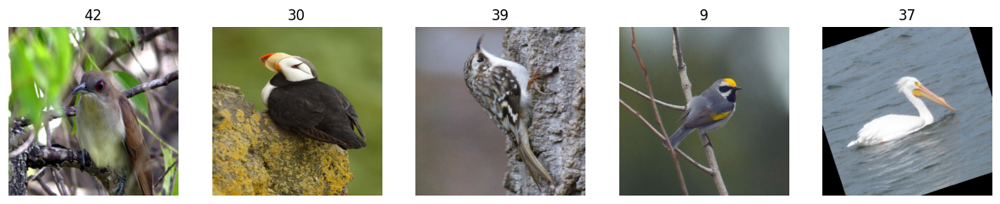

Epoch 14
Train Loss: 0.0000, Validation Loss: 0.2768, Validation Accuracy: 94.26%

Train Epoch 15 [0/1180]	Loss: 0.002162
Train Epoch 15 [30/1180]	Loss: 0.383021
Train Epoch 15 [60/1180]	Loss: 0.000087
Train Epoch 15 [90/1180]	Loss: 0.001743
Train Epoch 15 [120/1180]	Loss: 0.022095
Train Epoch 15 [150/1180]	Loss: 0.000266
Train Epoch 15 [180/1180]	Loss: 0.001311
Train Epoch 15 [210/1180]	Loss: 0.000023
Train Epoch 15 [240/1180]	Loss: 0.001738
Train Epoch 15 [270/1180]	Loss: 0.001015
Train Epoch 15 [300/1180]	Loss: 0.001771
Train Epoch 15 [330/1180]	Loss: 0.000774
Train Epoch 15 [360/1180]	Loss: 0.000103
Train Epoch 15 [390/1180]	Loss: 0.000936
Train Epoch 15 [420/1180]	Loss: 0.000561
Train Epoch 15 [450/1180]	Loss: 0.000572
Train Epoch 15 [480/1180]	Loss: 0.001247
Train Epoch 15 [510/1180]	Loss: 0.000833
Train Epoch 15 [540/1180]	Loss: 0.000090
Train Epoch 15 [570/1180]	Loss: 0.014323
Train Epoch 15 [600/1180]	Loss: 0.000286
Train Epoch 15 [630/1180]	Loss: 0.000125
Train Epoch 15 [660/

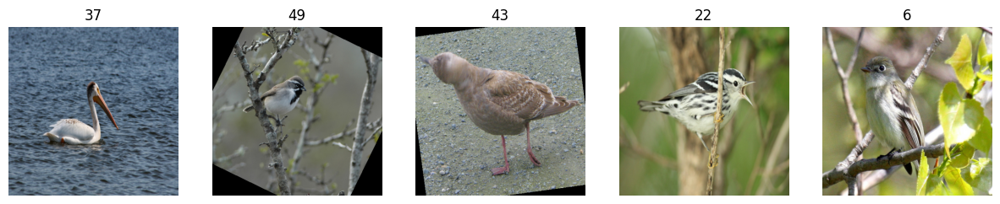

Epoch 15
Train Loss: 0.0023, Validation Loss: 0.2968, Validation Accuracy: 93.92%

Train Epoch 16 [0/1180]	Loss: 0.000969
Train Epoch 16 [30/1180]	Loss: 0.000055
Train Epoch 16 [60/1180]	Loss: 0.000132
Train Epoch 16 [90/1180]	Loss: 0.001595
Train Epoch 16 [120/1180]	Loss: 0.000043
Train Epoch 16 [150/1180]	Loss: 0.000019
Train Epoch 16 [180/1180]	Loss: 0.000233
Train Epoch 16 [210/1180]	Loss: 0.000066
Train Epoch 16 [240/1180]	Loss: 0.000399
Train Epoch 16 [270/1180]	Loss: 0.000177
Train Epoch 16 [300/1180]	Loss: 0.000230
Train Epoch 16 [330/1180]	Loss: 0.013980
Train Epoch 16 [360/1180]	Loss: 0.010257
Train Epoch 16 [390/1180]	Loss: 0.001773
Train Epoch 16 [420/1180]	Loss: 0.000438
Train Epoch 16 [450/1180]	Loss: 0.000831
Train Epoch 16 [480/1180]	Loss: 0.000798
Train Epoch 16 [510/1180]	Loss: 0.001193
Train Epoch 16 [540/1180]	Loss: 0.001587
Train Epoch 16 [570/1180]	Loss: 0.000337
Train Epoch 16 [600/1180]	Loss: 0.000512
Train Epoch 16 [630/1180]	Loss: 0.003246
Train Epoch 16 [660/

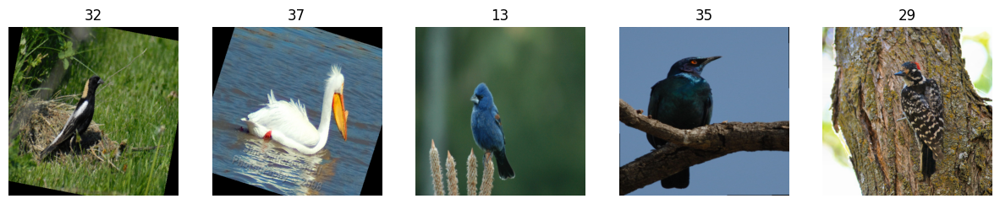

Epoch 16
Train Loss: 0.0006, Validation Loss: 0.2973, Validation Accuracy: 93.92%

Train Epoch 17 [0/1180]	Loss: 0.000075
Train Epoch 17 [30/1180]	Loss: 0.000131
Train Epoch 17 [60/1180]	Loss: 0.000014
Train Epoch 17 [90/1180]	Loss: 0.001178
Train Epoch 17 [120/1180]	Loss: 0.000111
Train Epoch 17 [150/1180]	Loss: 0.004527
Train Epoch 17 [180/1180]	Loss: 0.001106
Train Epoch 17 [210/1180]	Loss: 0.000080
Train Epoch 17 [240/1180]	Loss: 0.000973
Train Epoch 17 [270/1180]	Loss: 0.002104
Train Epoch 17 [300/1180]	Loss: 0.001156
Train Epoch 17 [330/1180]	Loss: 0.000174
Train Epoch 17 [360/1180]	Loss: 0.001339
Train Epoch 17 [390/1180]	Loss: 0.000672
Train Epoch 17 [420/1180]	Loss: 0.000356
Train Epoch 17 [450/1180]	Loss: 0.003350
Train Epoch 17 [480/1180]	Loss: 0.000430
Train Epoch 17 [510/1180]	Loss: 0.000039
Train Epoch 17 [540/1180]	Loss: 0.001314
Train Epoch 17 [570/1180]	Loss: 0.000136
Train Epoch 17 [600/1180]	Loss: 0.000025
Train Epoch 17 [630/1180]	Loss: 0.000586
Train Epoch 17 [660/

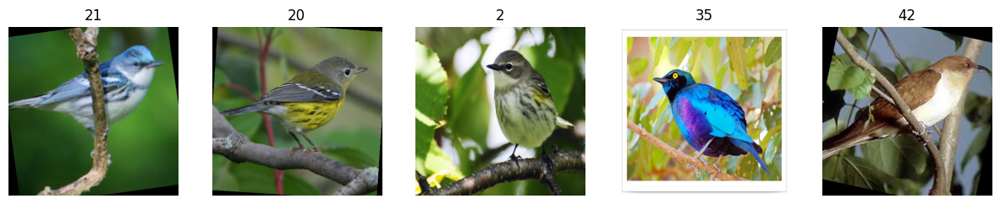

Epoch 17
Train Loss: 0.0002, Validation Loss: 0.2674, Validation Accuracy: 94.93%

Train Epoch 18 [0/1180]	Loss: 0.012480
Train Epoch 18 [30/1180]	Loss: 0.000508
Train Epoch 18 [60/1180]	Loss: 0.000125
Train Epoch 18 [90/1180]	Loss: 0.000069
Train Epoch 18 [120/1180]	Loss: 0.000244
Train Epoch 18 [150/1180]	Loss: 0.000470
Train Epoch 18 [180/1180]	Loss: 0.000596
Train Epoch 18 [210/1180]	Loss: 0.000176
Train Epoch 18 [240/1180]	Loss: 0.001330
Train Epoch 18 [270/1180]	Loss: 0.000584
Train Epoch 18 [300/1180]	Loss: 0.000172
Train Epoch 18 [330/1180]	Loss: 0.000045
Train Epoch 18 [360/1180]	Loss: 0.000246
Train Epoch 18 [390/1180]	Loss: 0.003120
Train Epoch 18 [420/1180]	Loss: 0.002867
Train Epoch 18 [450/1180]	Loss: 0.001299
Train Epoch 18 [480/1180]	Loss: 0.001247
Train Epoch 18 [510/1180]	Loss: 0.000211
Train Epoch 18 [540/1180]	Loss: 0.000095
Train Epoch 18 [570/1180]	Loss: 0.000129
Train Epoch 18 [600/1180]	Loss: 0.000015
Train Epoch 18 [630/1180]	Loss: 0.000133
Train Epoch 18 [660/

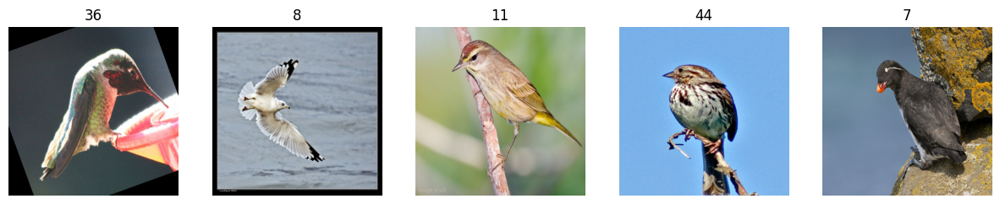

Epoch 18
Train Loss: 0.0001, Validation Loss: 0.2323, Validation Accuracy: 93.58%

Train Epoch 19 [0/1180]	Loss: 0.000080
Train Epoch 19 [30/1180]	Loss: 0.005329
Train Epoch 19 [60/1180]	Loss: 0.000967
Train Epoch 19 [90/1180]	Loss: 0.000131
Train Epoch 19 [120/1180]	Loss: 0.000154
Train Epoch 19 [150/1180]	Loss: 0.000628
Train Epoch 19 [180/1180]	Loss: 0.007625
Train Epoch 19 [210/1180]	Loss: 0.000431
Train Epoch 19 [240/1180]	Loss: 0.000778
Train Epoch 19 [270/1180]	Loss: 0.000488
Train Epoch 19 [300/1180]	Loss: 0.000067
Train Epoch 19 [330/1180]	Loss: 0.001464
Train Epoch 19 [360/1180]	Loss: 0.000027
Train Epoch 19 [390/1180]	Loss: 0.000025
Train Epoch 19 [420/1180]	Loss: 0.000112
Train Epoch 19 [450/1180]	Loss: 0.000083
Train Epoch 19 [480/1180]	Loss: 0.000085
Train Epoch 19 [510/1180]	Loss: 0.000021
Train Epoch 19 [540/1180]	Loss: 0.000202
Train Epoch 19 [570/1180]	Loss: 0.004960
Train Epoch 19 [600/1180]	Loss: 0.000529
Train Epoch 19 [630/1180]	Loss: 0.000071
Train Epoch 19 [660/

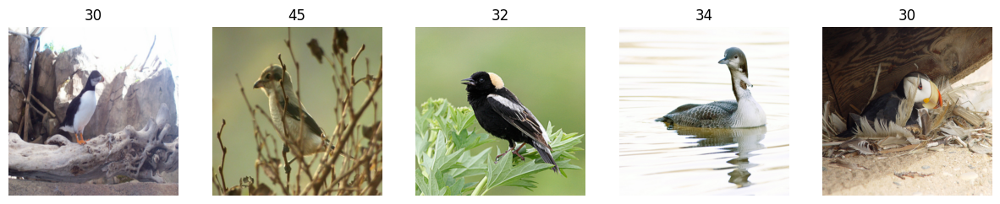

Epoch 19
Train Loss: 0.0002, Validation Loss: 0.2455, Validation Accuracy: 94.59%

[FINAL with Augmentation] Test Loss: 0.2607, Accuracy: 94.6309%
Best Accuracy: 95.61%
Elapsed Time: 3h, 37m, 47s
time: 3h, 217m, 47s


In [ ]:
### Main ###
start = time.time()
best = 0

### wandb ###
wandb.watch(model, log="all")

for epoch in range(EPOCH):
    # With Augmentation
    train_loss = train(model, train_loader, optimizer, epoch)
    val_loss, val_accuracy = evaluate(model, val_loader)

    # Save best model
    if val_accuracy > best:
        best = val_accuracy
        torch.save(model.state_dict(), "./best_model.pth")

    # augmentation 적용한 이미지 보기
    dataiter = iter(train_loader)
    images, labels = dataiter.__next__()
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))
    for i in range(5):
      image = images[i].numpy().transpose((1, 2, 0))
      image = np.clip(image, 0, 1)
      axes[i].imshow(image)
      axes[i].set_title(labels[i].item())
      axes[i].axis('off')
    plt.show()

    # Logging for model without augmentation
    wandb.log({
        'train_loss_with_aug': train_loss.item(),
        'val_loss_with_aug': val_loss,
        'val_accuracy_with_aug': val_accuracy,
    })

    print(f'Epoch {epoch}')
    print(f"Train Loss: {train_loss.item():.4f}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")
    print("")

# Test results
test_loss, test_accuracy = evaluate(model, test_loader)

wandb.log({'test_accuracy_with_aug': test_accuracy})

print(f'[FINAL with Augmentation] Test Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}%')

end = time.time()
elasped_time = end - start
print(f"Best Accuracy: {best:.2f}%")
print(f"Elapsed Time: {int(elasped_time/3600)}h, {int((elasped_time%3600)/60)}m, {int(elasped_time%60)}s")
print(f"time: {int (elasped_time/3600)}h, {int(elasped_time/60)}m, {int(elasped_time%60)}s")

In [ ]:
torch.save(model.state_dict(), "./model_state_dict.pt")